# 0.a. Import and settings

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import anndata
import scanpy as sc
from scanpy.plotting._tools.scatterplots import plot_scatter
import scanpy_scripts as ss
import bbknn

expr_cmap = ss.lib.expression_colormap(background_level=0.01)
np.set_printoptions(linewidth=180)
sc.settings.verbosity = 1
sc.settings.figdir = 'png'

In [3]:
import warnings
warnings.filterwarnings(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

# 1. Load data

## 1.1 BM

In [4]:
adBM = sc.read('data/h5ad/lymphoid_for_ni_20191128.h5ad')

In [5]:
adBM

AnnData object with n_obs × n_vars = 21230 × 21583 
    obs: 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'fetal.ids', 'sort.ids', 'tissue', 'lanes', 'stages', 'sample.type', 'gender', 'AnnatomicalPart', 'sequencing.type', 'predicted.cell.label', 'doublets', 'cell.labels', 'LouvainClustering', 'is_doublet_wolock', 'is_doublet', 'is_doublet_poptrim', 'scrublet_score', 'scrublet_cluster_score', 'processing.type', 'n_genes', 'leiden', '__is_in_cluster__', 'cell.labels.backlabelled.1', 'cell.labels.backlabelled.2', 'cell.labels3', 'cell.labels2', 'cell.labels1'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell.labels.backlabelled.1_colors', 'cell.labels_colors', 'cell.labels_sizes', 'dendrogram_leiden', 'diffmap_evals', 'draw_graph', 'leiden', 'leiden_colors', 'neighbors', 'orig.ident_colors', 'paga', 'pca', 'processing.type_colors', 'rank_genes_groups', 'rank_genes_groups_filtered', 'sequencing.type_colors'
    obsm: 'X_diffmap', 'X_draw_gr

In [18]:
adBM.obs['annot'] = 'bm_' + adBM.obs['cell.labels'].astype(str)

In [7]:
sc.pp.normalize_total(adBM, target_sum=1e4)

In [8]:
sc.pp.log1p(adBM)

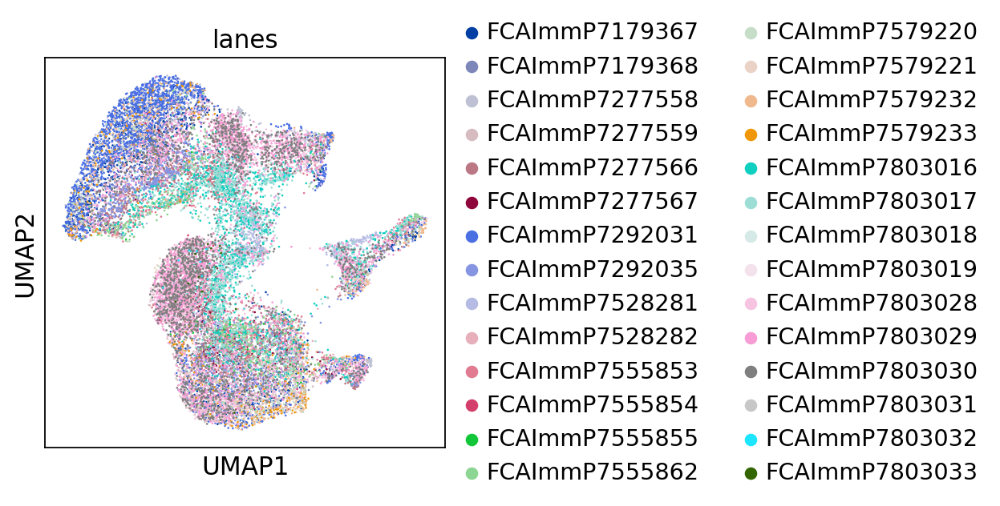

In [92]:
sc.set_figure_params(dpi=80)
ss.lib.set_figsize((4,4))
ss.lib.plot_scatter(adBM, basis='umap', color='lanes')

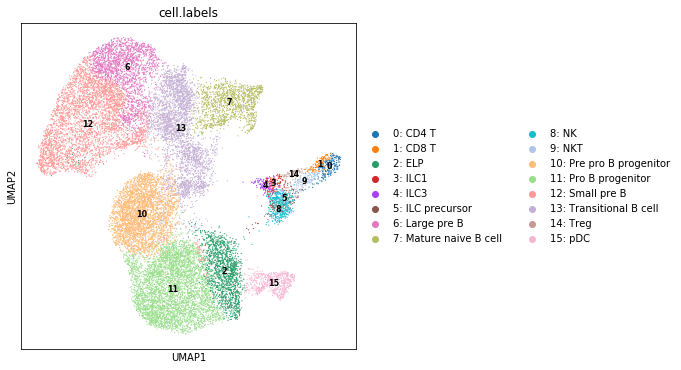

In [32]:
ss.lib.set_figsize((6,6))
ss.lib.plot_embedding(adBM, basis='umap', groupby='cell.labels')

## 1.2 Thymus

In [95]:
adTH = sc.read('data/h5ad/GSE133341_thymus_lymphoid_processed.h5ad')

In [96]:
adTH

AnnData object with n_obs × n_vars = 4099 × 15959 
    obs: 'batch', 'n_counts', 'n_genes', 'percent_hb', 'percent_mito', 'percent_ribo', 'leiden_r0_1', 'leiden_r0_2', 'leiden_r0_3', 'leiden_r0_4', 'leiden_r0_5', 'leiden_r0_6', 'leiden_r0_7', 'leiden_r0_8', 'leiden_r0_9', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_hm_r0_8', 'leiden_hm_r0_9', 'leiden_hm_r1_0', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_bk_r0_6', 'leiden_bk_r0_7', 'leiden_bk_r0_8', 'leiden_bk_r0_9', 'leiden_bk_r1_0', 'leiden_sub_r0_05', 'leiden_sub_r0_1', 'annot'
    var: 'cc', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'leiden', 'leiden_bk_r0_1_colors', 'leiden_bk_r0_2_colors', 'leiden_bk_r0_3_colors', 'leiden_bk_r0_4_colors', 'leiden_bk_r0_5_colors', 'leiden_bk_r0_6_colors', 'leiden_bk_r0_7_colors', 'leiden_bk

In [97]:
np.expm1(adTH.raw.X).sum(axis=1)

array([10000.   ,  9999.999, 10000.   , ..., 10000.001, 10000.   , 10000.   ], dtype=float32)

In [98]:
adTH.X = adTH.raw.X

In [99]:
adTH.obs['annot'] = 'th_' + adTH.obs['annot'].astype(str)

In [100]:
adTH.obs['lanes'] = adTH.obs['batch']

In [101]:
del adTH.obs['batch']

## 1.3 Fetal skin T/NK

In [15]:
adT = sc.read('data/h5ad/fetal_skin_hierarch1_T-cells_processed.h5ad')

In [16]:
adT

AnnData object with n_obs × n_vars = 18292 × 20567 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'chemistry_colors', 'donor_colors', 'leiden', 'leiden_bk_r0_1_colors', 'leiden_bk_r0_2_colors', 'leiden_bk_r0_3_colors', 'leiden_b

In [20]:
adT.obs['annot'] = adT.obs['leiden_hm_r0_6'].cat.rename_categories(
    ['fs_NK_1', 'fs_CD4T_1', 'fs_proliferating', 'fs_CD8T', 'fs_ILC3', 'fs_Treg', 'fs_NKT', 'fs_NK_2', 'fs_LTi', 'fs_CD4T_2', 'fs_ILC2', 'fs_MLP', 'fs_doublet_macrophage', 'fs_doublet_fibro'])

In [21]:
np.expm1(adT.raw.X).sum(axis=1)

matrix([[10000.   ],
        [10000.001],
        [10000.001],
        ...,
        [10000.   ],
        [ 9999.999],
        [10000.   ]], dtype=float32)

In [22]:
adT.X = adT.raw.X

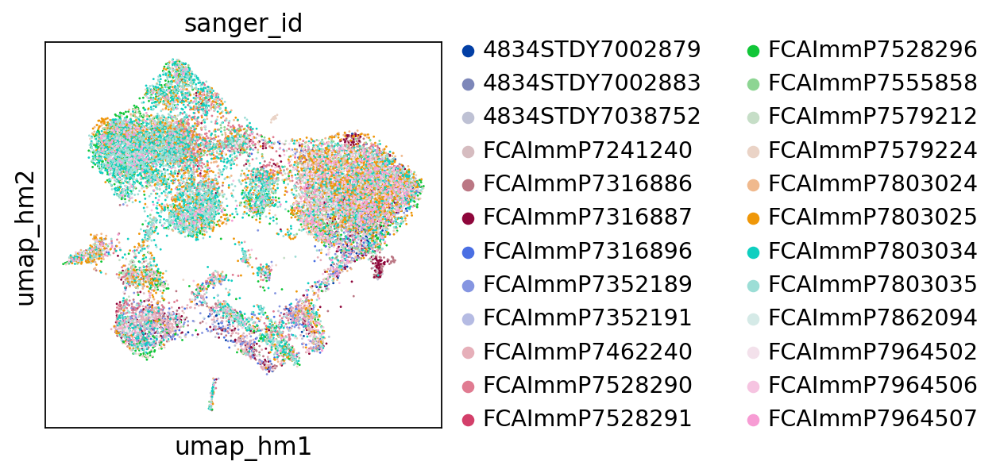

In [93]:
sc.set_figure_params(dpi=80)
ss.lib.set_figsize((4,4))
ss.lib.plot_scatter(adT, basis='umap_hm', color='sanger_id')

## 1.4 Fetal skin B

In [23]:
adB = sc.read('data/h5ad/fetal_skin_hierarch1_B-cells_processed.h5ad')

In [24]:
adB

AnnData object with n_obs × n_vars = 3862 × 16446 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'doublet', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'lr_annot', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_hm_r0_6', 'leiden_hm_r0_7', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', '__is_in_cluster__', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'leiden_bk_nocc_r0_1', 'leiden_bk_nocc_r0_2', 'leiden_bk_nocc_r0_3', 'leiden_bk_nocc_r0_4', 'leiden_hm_nocc_r0_5', 'leiden_bk_nocc_r0_5', 'rachel_annot1', 'leiden_hm_r3_0', 'scrublet_z', 'cluster_scrublet_z', 'pooled_

In [25]:
adB.obs['annot'] = 'fs_' + adB.obs['rachel_annot1'].astype(str)

In [26]:
np.expm1(adB.raw.X).sum(axis=1)

matrix([[10000.   ],
        [10000.   ],
        [10000.001],
        ...,
        [ 9999.998],
        [10000.   ],
        [10000.   ]], dtype=float32)

... storing 'annot' as categorical


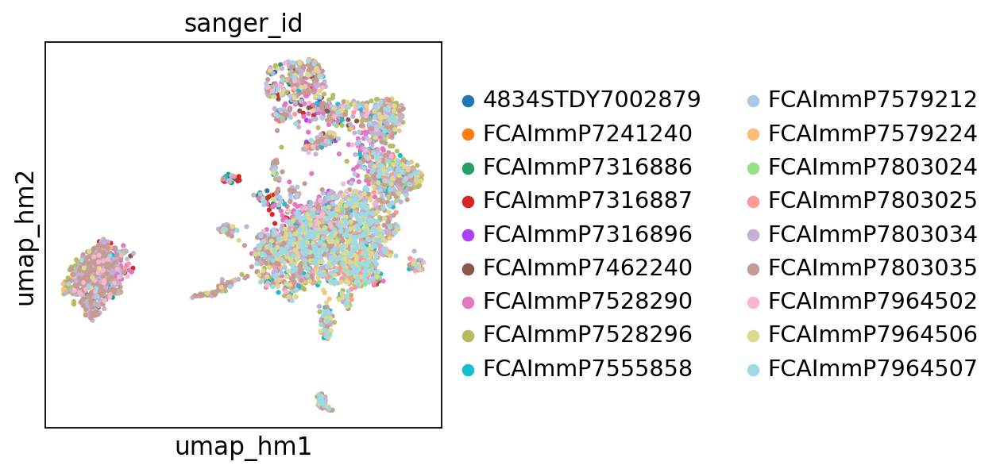

In [94]:
sc.set_figure_params(dpi=80)
ss.lib.set_figsize((4,4))
ss.lib.plot_scatter(adB, basis='umap_hm', color='sanger_id')

In [27]:
adB.X = adB.raw.X

# 2. Pool data

In [28]:
ad = anndata.AnnData.concatenate(adT, adB, adBM, adTH)

In [33]:
ad

AnnData object with n_obs × n_vars = 47483 × 13303 
    obs: 'AnnatomicalPart', 'LouvainClustering', '__is_in_cluster__', 'annot', 'batch', 'bh_doublet_pval', 'cell.labels', 'cell.labels.backlabelled.1', 'cell.labels.backlabelled.2', 'cell.labels1', 'cell.labels2', 'cell.labels3', 'cell_caller', 'chemistry', 'chemistry_sorting', 'cluster_scrublet_score', 'cluster_scrublet_z', 'donor', 'doublet', 'doublet_pval', 'doublets', 'fetal.ids', 'gender', 'hierarchy1', 'is_doublet', 'is_doublet_poptrim', 'is_doublet_wolock', 'lanes', 'leiden', 'leiden_bk_nocc_r0_1', 'leiden_bk_nocc_r0_2', 'leiden_bk_nocc_r0_3', 'leiden_bk_nocc_r0_4', 'leiden_bk_nocc_r0_5', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_bk_r0_6', 'leiden_bk_r0_7', 'leiden_bk_r0_8', 'leiden_bk_r0_9', 'leiden_bk_r1_0', 'leiden_hm_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'leiden_hm_nocc_r0_5', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_

In [35]:
ad.obs.loc[ad.obs.batch.isin(['0', '1']), 'batch'] = '1'

In [37]:
ad.obs.batch.cat.remove_unused_categories(inplace=True)

In [62]:
ad.obs.batch.cat.rename_categories(['skin', 'bone_marrow', 'thymus'], inplace=True)

In [112]:
ad.obs['lane'] = np.concatenate([adT.obs.sanger_id.astype(str), adB.obs.sanger_id.astype(str), adBM.obs.lanes.astype(str), adTH.obs.lanes.astype(str)])

In [120]:
good_lanes = ad.obs.lane.value_counts().index[ad.obs.lane.value_counts() > 10].to_list()

In [39]:
sc.pp.highly_variable_genes(ad, flavor='seurat', batch_key='batch', n_top_genes=3000)

... storing 'AnnatomicalPart' as categorical
... storing 'LouvainClustering' as categorical
... storing '__is_in_cluster__' as categorical
... storing 'annot' as categorical
... storing 'cell.labels' as categorical
... storing 'cell.labels.backlabelled.1' as categorical
... storing 'cell.labels.backlabelled.2' as categorical
... storing 'cell.labels1' as categorical
... storing 'cell.labels2' as categorical
... storing 'cell.labels3' as categorical
... storing 'cell_caller' as categorical
... storing 'chemistry' as categorical
... storing 'chemistry_sorting' as categorical
... storing 'donor' as categorical
... storing 'doublet' as categorical
... storing 'doublets' as categorical
... storing 'fetal.ids' as categorical
... storing 'gender' as categorical
... storing 'is_doublet' as categorical
... storing 'is_doublet_poptrim' as categorical
... storing 'is_doublet_wolock' as categorical
... storing 'lanes' as categorical
... storing 'leiden' as categorical
... storing 'leiden_bk_nocc_r

In [40]:
ad.var.highly_variable.value_counts()

False    10303
True      3000
Name: highly_variable, dtype: int64

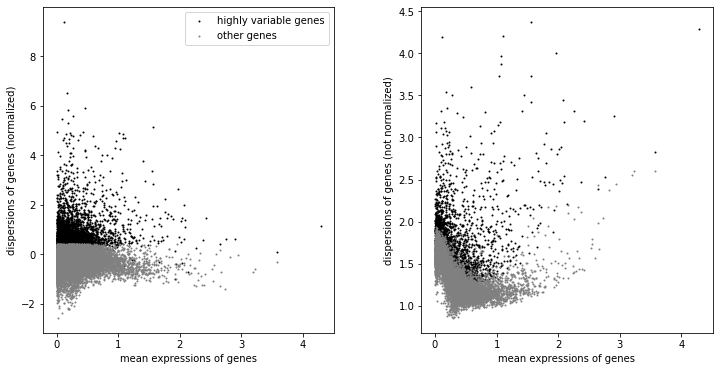

In [41]:
sc.pl.highly_variable_genes(ad)

In [155]:
ad.var['highly_variable'] = ad.var.highly_variable & (ad.var.means > 0.0125) & (ad.var.means < 3) & (~ad.var['cc-0'])

In [134]:
sc.pp.scale(ad, max_value=10)

In [156]:
sc.pp.pca(ad, svd_solver='arpack', use_highly_variable=True)

In [157]:
sc.pp.neighbors(ad, n_pcs=30)

In [158]:
ss.lib.run_harmony(ad, batch='batch')

In [159]:
ss.lib.run_harmony(ad, batch=['batch', 'lane'], key_added='hm2')

In [160]:
ss.lib.neighbors(ad, use_rep='X_pca_hm', key_added='hm')

In [161]:
ss.lib.umap(ad, use_graph='neighbors_hm', key_added='hm')

In [162]:
ss.lib.neighbors(ad, use_rep='X_pca_hm2', key_added='hm2')

In [163]:
ss.lib.umap(ad, use_graph='neighbors_hm2', key_added='hm2')

In [164]:
for k in ad.uns_keys():
    if k.endswith('_colors'):
        del ad.uns[k]

... storing 'lr_annot1' as categorical
... storing 'lr_annot1hm2' as categorical


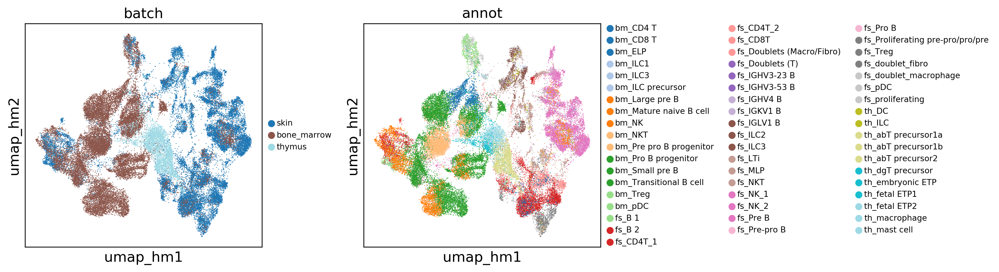

In [165]:
ss.lib.set_figsize((4,4))
plot_scatter(ad, basis='umap_hm', color=['batch', 'annot'], palette='tab20', wspace=0.3, legend_fontsize=8)

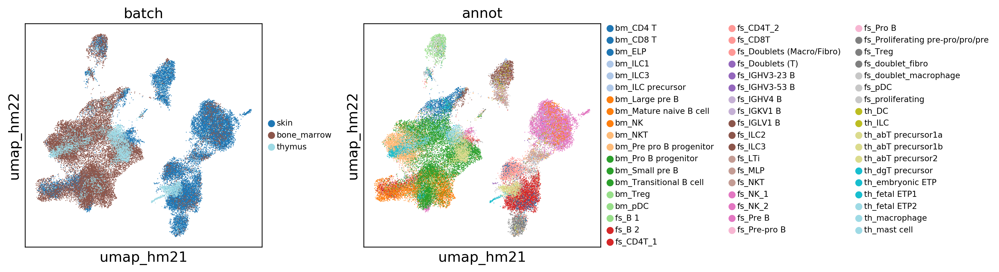

In [166]:
ss.lib.set_figsize((4,4))
plot_scatter(ad, basis='umap_hm2', color=['batch', 'annot'], palette='tab20', wspace=0.3, legend_fontsize=8)

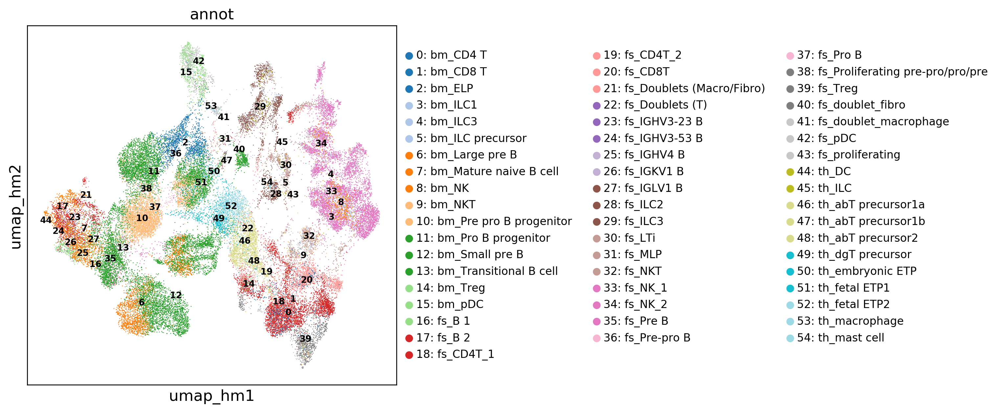

In [167]:
sc.set_figure_params(fontsize=14, dpi=120)
ss.lib.set_figsize((6,6))
ss.lib.plot_embedding(ad, basis='umap_hm', groupby='annot', legend_fontsize=10)

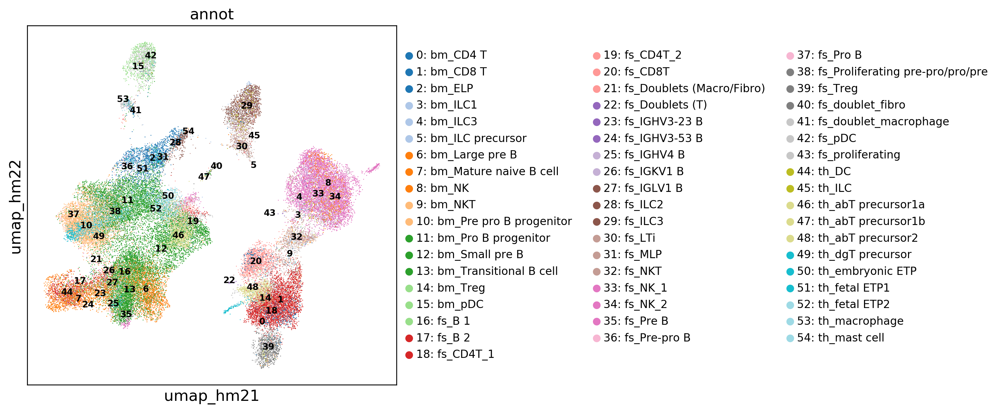

In [168]:
sc.set_figure_params(fontsize=14, dpi=120)
ss.lib.set_figsize((6,6))
ss.lib.plot_embedding(ad, basis='umap_hm2', groupby='annot', legend_fontsize=10)

In [54]:
ss.lib.run_bbknn(ad, batch='batch')

In [55]:
ss.lib.umap(ad, use_graph='neighbors_bk', key_added='bk')

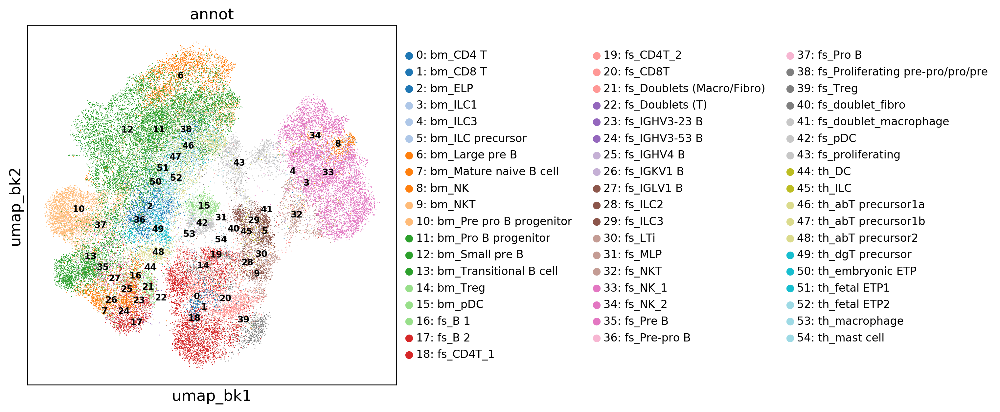

In [60]:
sc.set_figure_params(fontsize=14, dpi=120)
ss.lib.set_figsize((6,6))
ss.lib.plot_embedding(ad, basis='umap_bk', groupby='annot', legend_fontsize=10)

# 3. Project labels by LR

In [61]:
del ad.obs['lr_annot']

## 3.1 Use BM, TH to predict SK, using PCA_hm

In [169]:
ad.obs['lr_annot1'] = ss.lib.LR_annotate(ad, train_label=ad.obs['annot'].values, train_x=ad.obsm['X_pca_hm'], subset=(ad.obs['batch'].isin(['bone_marrow', 'thymus'])).values, use_rep='X_pca_hm', penalty='l1', return_label=True)

In [170]:
ss.lib.cross_table(ad, 'annot', 'lr_annot1', normalise='x', highlight=1)

lr_annot1,bm_CD4 T,bm_CD8 T,bm_ELP


In [171]:
ad.obs['lr_annot1hm2'] = ss.lib.LR_annotate(ad, train_label=ad.obs['annot'].values, train_x=ad.obsm['X_pca_hm2'], subset=(ad.obs['batch'].isin(['bone_marrow', 'thymus'])).values, use_rep='X_pca_hm2', penalty='l1', return_label=True)

In [172]:
ss.lib.cross_table(ad, 'annot', 'lr_annot1hm2', normalise='x', highlight=1)

lr_annot1hm2,bm_CD4 T,bm_CD8 T,bm_ELP


## 3.2 Use SK to predict BM, TH, using PCA_hm

In [173]:
ad.obs['lr_annot2'] = ss.lib.LR_annotate(ad, train_label=ad.obs['annot'].values, train_x=ad.obsm['X_pca_hm'], subset=(ad.obs['batch'].isin(['skin'])).values, use_rep='X_pca_hm', return_label=True, penalty='l1')

In [174]:
ss.lib.cross_table(ad, 'annot', 'lr_annot2', normalise='x', highlight=1)

lr_annot2,fs_B 1,fs_B 2,fs_CD4T_1


In [175]:
ad.obs['lr_annot2hm2'] = ss.lib.LR_annotate(ad, train_label=ad.obs['annot'].values, train_x=ad.obsm['X_pca_hm2'], subset=(ad.obs['batch'].isin(['skin'])).values, use_rep='X_pca_hm2', return_label=True, penalty='l1')

In [176]:
ss.lib.cross_table(ad, 'annot', 'lr_annot2hm2', normalise='x', highlight=1)

## 3.3 Use SK, TH to predict BM, using PCA_hm

In [177]:
ad.obs['lr_annot3'] = ss.lib.LR_annotate(ad, train_label=ad.obs['annot'].values, train_x=ad.obsm['X_pca_hm'], subset=(ad.obs['batch'].isin(['skin', 'thymus'])).values, use_rep='X_pca_hm', return_label=True, penalty='l1')

In [178]:
ss.lib.cross_table(ad, 'annot', 'lr_annot3', normalise='x', highlight=1)